In [26]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

import seaborn as sns

import numpy as np
import pandas as pd

from statsmodels.nonparametric.smoothers_lowess import lowess

In [2]:
font_path = "/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Regular.ttf"
fm.fontManager.addfont(font_path)
plt.rcParams["font.family"] = "Work Sans"
work_sans_title = fm.FontProperties(fname="/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Bold.ttf", size=16)
work_sans_axis = fm.FontProperties(fname="/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Regular.ttf", size=12)

In [3]:
df = pd.read_csv("/Users/anvi/Desktop/climate_science/GISS_Surface_Temperature_Analysis_v4/data/L_OTI/global/global_mean.csv", skiprows=1)

In [4]:
print(f"Number of columns in df: {df.shape[1]}")
print(f"Number of rows in df: {df.shape[0]}")

Number of columns in df: 19
Number of rows in df: 147


In [5]:
df

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.26,-0.10,-0.17,-0.11,-0.22,-0.19,-0.11,-.15,-.24,-.23,-.18,-.18,***,***,-0.13,-0.17,-.21
1,1881,-0.20,-0.15,0.03,0.05,0.05,-0.19,0.00,-0.04,-.16,-.22,-.19,-.08,-.09,-.10,-.18,0.04,-0.08,-.19
2,1882,0.16,0.13,0.04,-0.16,-0.14,-0.23,-0.17,-0.08,-.15,-.24,-.17,-.37,-.12,-.09,.07,-0.09,-0.16,-.19
3,1883,-0.30,-0.37,-0.13,-0.19,-0.18,-0.07,-0.08,-0.14,-.22,-.11,-.25,-.12,-.18,-.20,-.34,-0.16,-0.10,-.19
4,1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-.27,-.25,-.34,-.31,-.29,-.27,-.11,-0.37,-0.31,-.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,2022,0.91,0.89,1.05,0.83,0.84,0.93,0.94,0.94,.88,.97,.73,.80,.89,.90,.90,0.91,0.94,.86
143,2023,0.88,0.97,1.23,0.99,0.94,1.09,1.19,1.19,1.48,1.35,1.40,1.36,1.17,1.12,.88,1.05,1.16,1.41
144,2024,1.25,1.44,1.40,1.32,1.16,1.23,1.20,1.30,1.21,1.35,1.30,1.27,1.29,1.29,1.35,1.29,1.25,1.29
145,2025,1.38,1.26,1.37,1.25,1.08,1.07,1.02,1.18,1.25,1.19,1.21,1.06,1.19,1.21,1.30,1.23,1.09,1.22


---

J-D : calendar year average; from the first day of January to the last day of December

D-N : meteorological year average; from the first day of December to the last day of November

In [6]:
df.rename(columns={'Jan':'January', 'Feb':'February', 'Mar':'March', 'Apr':'April', 'May':'May', 'Jun':'June', 'Jul':'July', 'Aug':'August', 'Sep':'September', 'Oct':'October', 'Nov':'November', 'Dec':'December'}, inplace=True)

In [7]:
temp_columns = df.columns.drop('Year')

In [8]:
df[temp_columns] = df[temp_columns].apply(pd.to_numeric, errors='coerce') * 0.01

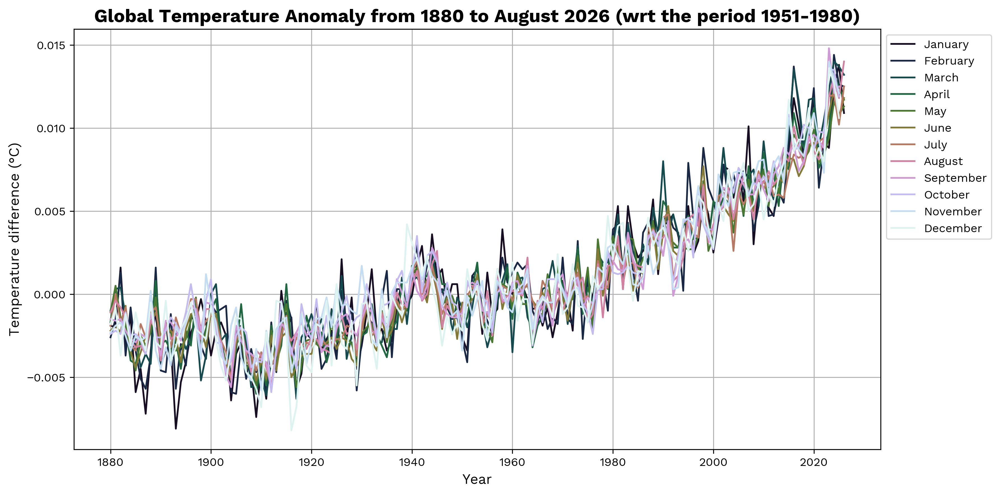

In [9]:
plt.figure(figsize=(12, 6), dpi=300)

monthly_columns = temp_columns[:12]

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("cubehelix", n_colors=len(monthly_columns))

#plotting the temperature data for each month
for col in monthly_columns:
    plt.plot(df['Year'], df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Global_Temperature_Anomaly_1880-2026.png', dpi=1000, bbox_inches='tight')
plt.show()

In [10]:
plt.figure(figsize=(12, 6), dpi=1000)

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("magma", n_colors=len(temp_columns[12:14]))

#plotting the temperature data for each month
for col in temp_columns[12:14]:
    plt.plot(df['Year'], df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

In [11]:
plt.figure(figsize=(12, 6), dpi=1000)

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("magma", n_colors=len(temp_columns[14:17:2]))

#plotting the temperature data for each month
for col in temp_columns[14:17:2]:
    plt.plot(df['Year'], df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

In [12]:
# transforming the months into rows; and inverting to have January at the top and December at the bottom
heatmap_data = df.set_index("Year")[monthly_columns].T.iloc[::-1]

In [13]:
plt.figure(figsize=(14, 6), dpi=1000)

ax = sns.heatmap(
        heatmap_data,
        cmap="RdYlBu_r",
        center=0,
        linewidths=0.1,
        xticklabels=4,
        cbar_kws={"label": "Temperature difference (°C)"}
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.xlabel("Year", fontproperties=work_sans_axis)
plt.ylabel("Month", fontproperties=work_sans_axis)
plt.title(
    "Monthly Global Temperature Anomalies",
    fontproperties=work_sans_title
)
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/heatmaps/Monthly_Global_Temperature_Anomalies.png', dpi=1000, bbox_inches='tight')
plt.show()

In [16]:
#i want the mean temperature anomaly for each year
annual_mean = df[monthly_columns].mean(axis=1)

In [ ]:
plt.figure(figsize=(12, 6), dpi=1000)

#plotting the temperature data for each month
plt.plot(df['Year'], annual_mean, color='black', marker='o', markersize=3)

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Annual Mean - Global Temperature Anomaly 1880-2026 (wrt 1951-1980)', fontproperties=work_sans_title)
plt.grid()
plt.tight_layout()
plt.show()

In [36]:
plt.figure(figsize=(12, 6), dpi=1000)

#plotting the temperature data for each month
plt.plot(df['Year'], annual_mean, color='black', marker='o', markersize=3)

#lowess smoothing
lowess_smoothed_01 = lowess(annual_mean, df['Year'], frac=0.1, delta = 0.01*len(df['Year']))
lowess_smoothed_05 = lowess(annual_mean, df['Year'], frac=0.5, delta = 0.01*len(df['Year']))
lowess_smoothed_1 = lowess(annual_mean, df['Year'], frac=1, delta = 0.01*len(df['Year']))

#plot the lowess smoothed line
plt.plot(lowess_smoothed_01[:, 0], lowess_smoothed_01[:, 1], color='crimson', label='Lowess Smoothed (frac=0.1)', linewidth=2)
plt.plot(lowess_smoothed_05[:, 0], lowess_smoothed_05[:, 1], color='forestgreen', label='Lowess Smoothed (frac=0.5)', linewidth=2)
plt.plot(lowess_smoothed_1[:, 0], lowess_smoothed_1[:, 1], color='navy', label='Lowess Smoothed (frac=1.0)', linewidth=2)

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Annual Mean - Global Temperature Anomaly 1880-2026 (wrt 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(12, 6), dpi=1000)

#plotting the temperature data for each month
plt.plot(df['Year'], annual_mean, color='black', marker='o', markersize=3)


#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Annual Mean - Global Temperature Anomaly 1880-2026 (wrt 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()